# Библиотеки

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [2]:
# Фиксируем SEED для воспроизводимости наших экспериментов
RANDOM_SEED = 42
!pip freeze > requirements.txt

# Импорт данных

In [3]:
df_1 = pd.read_excel('X_bp.xlsx',index_col=0)
df_2 = pd.read_excel('X_nup.xlsx',index_col=0)

In [4]:
df_1.head(2)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0


In [5]:
df_2.head(2)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0


In [6]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [7]:
df_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [8]:
# готовим таблицы к объединению по индексу
columns_1 = df_1.columns.insert(0,'id')
df_1 = df_1.reset_index()
df_1.columns = columns_1

columns_2 = df_2.columns.insert(0,'id')
df_2 = df_2.reset_index()
df_2.columns = columns_2

In [9]:
# объединяем
df = pd.merge(df_1, df_2,how="inner", on='id')
df.set_index('id', inplace=True)

In [10]:
df.sample(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
858,3.133253,1987.311373,749.086041,70.682827,22.407309,307.698213,399.313684,73.909383,1188.307418,150.144485,90,4.692441,50.858542
582,3.228435,2019.043878,573.815019,88.459308,20.583309,276.711107,593.134892,78.556224,2227.447322,272.671714,90,9.315287,57.960591
733,3.495880,2031.800308,1428.659139,105.107136,20.219368,292.471641,590.760720,79.828646,2446.724778,274.013341,90,8.884554,56.015594
340,2.143969,1807.595910,361.022238,176.918846,22.959924,275.341718,122.478765,73.544720,2711.669582,239.185654,0,6.655858,62.395748
698,2.643124,1988.098999,1097.244899,86.510595,23.337462,275.650034,274.154374,73.897695,2339.869511,243.579227,90,10.853242,54.193898


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

Видим, что в полученных после объединения данных пропусков не имеется, всего записей 1023.                   

# EDA

### Статистические показатели по каждому из параметров

In [12]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


### Гистограммы распределения и диаграммы ящика с усами

In [13]:
cols = df.columns

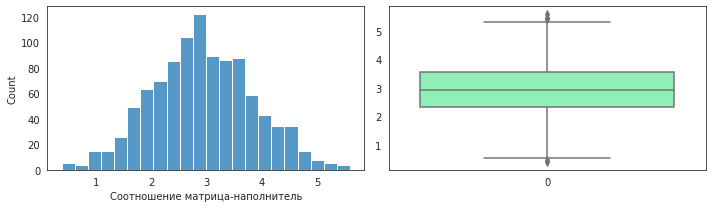

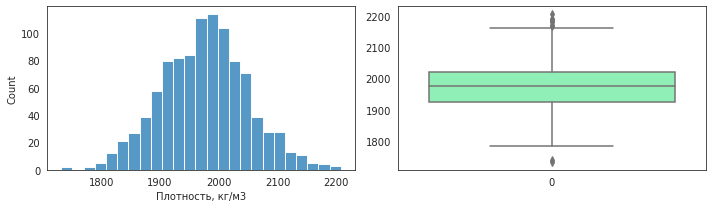

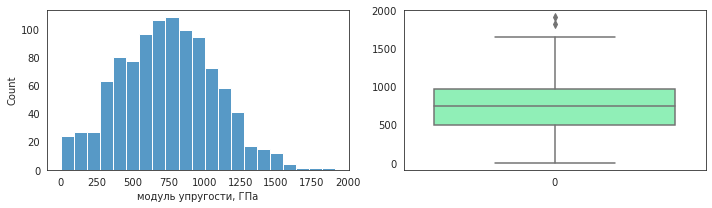

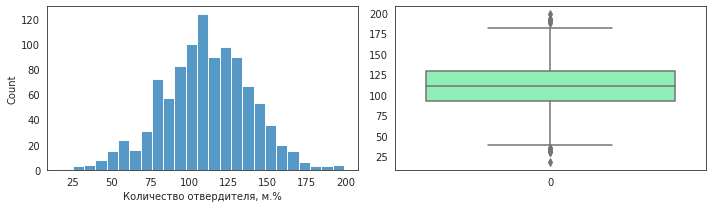

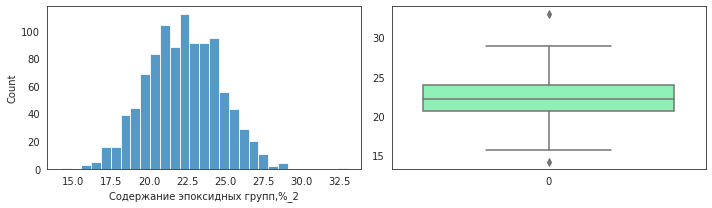

...

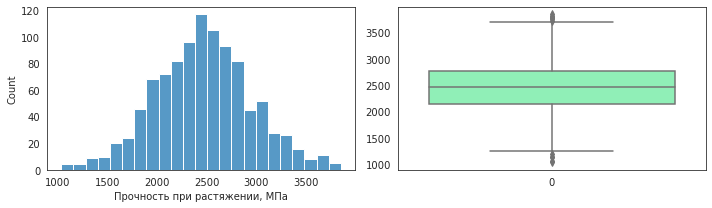

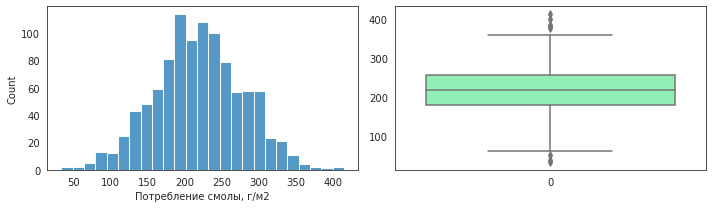

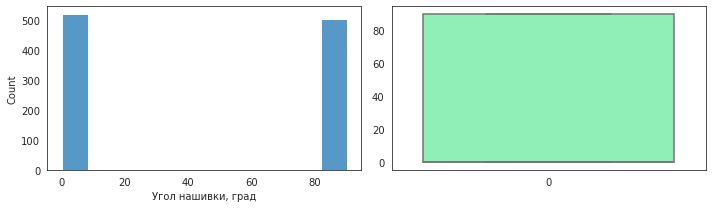

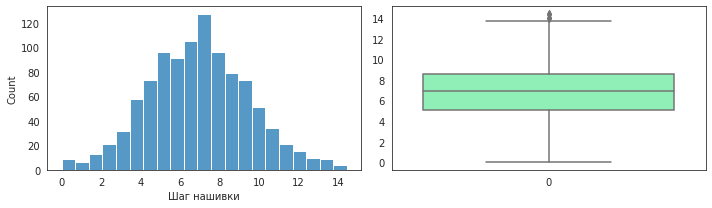

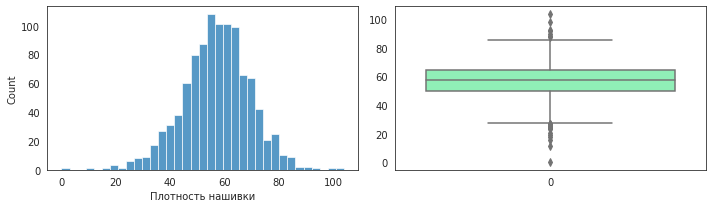

In [14]:
for i in cols:
    f = plt.figure(figsize=(10, 3))
    gs = f.add_gridspec(1, 2)
    with sns.axes_style("white"):
        ax = f.add_subplot(gs[0, 0])
        sns.histplot(df[i], kde = False)#, rug=False, color='b')

    with sns.axes_style("white"):
        ax = f.add_subplot(gs[0, 1])
        sns.boxplot(data=df[i], palette='rainbow')

    f.tight_layout()

Видим, что у всех признаков, кроме "Угол нашивки, град" распределение нормальное или близко к нормальному, а также имеются незначительные выбросы.

In [15]:
df['Угол нашивки, град'].value_counts()

0     520
90    503
Name: Угол нашивки, град, dtype: int64

Данный признак является бинарным.

In [16]:
# !!! ИЗ ЦЕЛЕВЫХ ТОЖЕ УБИРАЕМ ВЫБРОСЫ
# Уберем бинарный признак и подготовим список признаков, в которых есть выбросы
target_cols = ['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
outliered_cols = cols.drop('Угол нашивки, град')
# for col in target_cols:
#     outliered_cols = outliered_cols.drop(col)

### Попарные графики рассеяния точек

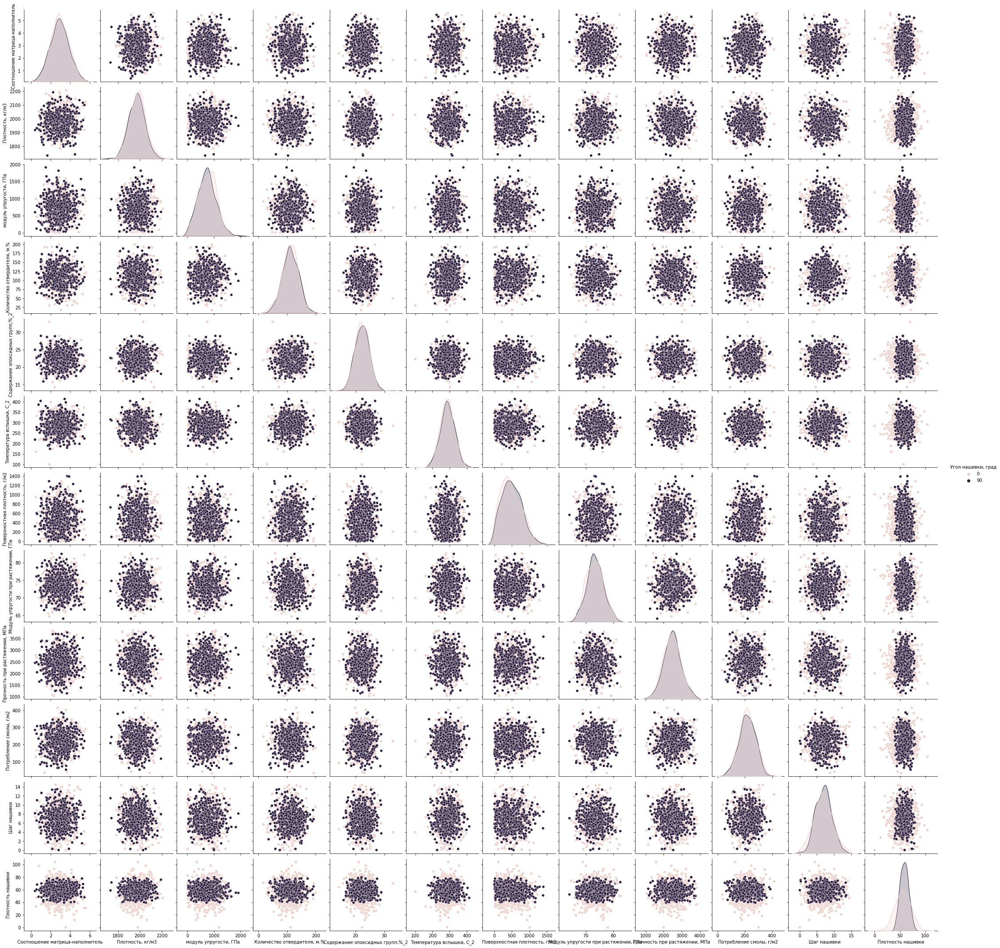

In [17]:
# Нарисуем попарные графики рассеяния с подсветкой угла нашивки
sns.pairplot(df, hue='Угол нашивки, град')

Из диаграммы попарного распределения видим отсутствие зависимостей среди признаков, а также подтверждаются незначительные выбросы. Кроме того можем сказать, что признак Плотность нашивки чувствителен к признаку Угол нашивки, град, а именно при меньшем угле нашивки дисперсия плотности нашивки увеличивается.

### Анализ и исключение выбросов

In [18]:
# Функция для рассчёта границы выбросов и их удаления
def outliers(df:pd.DataFrame, feature:str):
    print('Признак:', feature)
    median = df[feature].median()
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    print('\n1й квантиль: {},'.format(Q1),
          '\n3й квантиль: {},'.format(Q3),
          "\nМежквартильный интервал: {}, ".format(IQR),
          "\nГраницы выбросов: [{f}, {l}].".format(f=Q1 - 1.5*IQR, l=Q3 + 1.5*IQR))
    
    # Above Upper bound
    upper = df[feature] >= (Q3+1.5*IQR)
    print('Выше верхней границы:')
    display(df[upper])

    # Below Lower bound
    lower = df[feature] <= (Q1-1.5*IQR)
    print('Ниже нижней границы')
    display(df[lower])
    return df[~upper & ~lower].index # сохраняем индексы за исключением выбросов

In [19]:
# Для каждого признака, за исключением целевых и бинарного вычислим выбросы и удалим их из датасета
good_index = set(df.index) # здесь будем собирать индексы без выбросов по всем параметрам
for col in outliered_cols:
    col_ids = set(outliers(df, col)) # индексы по текущему параметру
    good_index = good_index.intersection(col_ids) # объединение множеств

Признак: Соотношение матрица-наполнитель

1й квантиль: 2.3178866441274053, 
3й квантиль: 3.5526598969172998, 
Межквартильный интервал: 1.2347732527898945,  
Границы выбросов: [0.4657267649425636, 5.4048197761021415].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
237,5.591742,2121.579070,923.668248,121.713099,21.809294,289.772089,134.349865,74.192008,2203.674811,290.173270,0,7.181458,30.882695
284,5.425139,2003.272119,524.810110,138.291706,20.793664,370.823575,267.576436,68.492114,1837.316535,226.136105,0,4.185605,31.218450
505,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0,1.280057,50.323463
877,5.455566,2099.973071,1249.672556,108.676613,20.171757,223.516610,467.645148,66.657495,2317.268743,219.733228,90,8.595968,47.823710


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
378,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0,7.317168,33.326279
673,0.389403,1917.699889,602.093245,93.346585,24.966084,218.303388,325.199965,71.693413,2453.290387,284.389049,90,8.160306,58.039018


Признак: Плотность, кг/м3

1й квантиль: 1924.15546684573, 
3й квантиль: 2021.37437454241, 
Межквартильный интервал: 97.21890769667993,  
Границы выбросов: [1778.3271053007102, 2167.20273608743].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
100,3.565855,2207.773481,696.149163,94.187613,23.562885,291.803991,384.629393,68.784473,2596.685251,402.163809,0,4.512825,46.775469
224,1.534731,2182.751822,400.855580,118.766917,24.168973,326.049476,556.740492,78.474257,1773.569546,285.111003,0,5.801833,73.541409
251,3.759259,2172.246796,97.236317,112.401839,25.605815,281.467572,391.677214,72.838256,2599.779668,237.007233,0,9.392177,46.008294
264,2.894531,2192.297637,898.658996,127.049451,24.493248,328.174535,260.899791,74.385740,1822.735858,249.479288,0,2.841129,76.390449
317,2.930757,2184.493200,933.368211,117.801565,23.794065,255.019718,493.908897,72.268947,2617.869224,191.079776,0,8.182531,53.264181
499,1.813906,2170.342363,909.682529,89.333827,18.825181,270.810351,95.648447,71.933723,3047.474139,238.096456,0,1.626690,51.829634
626,2.245217,2192.738783,611.766338,108.265862,18.056093,339.313586,391.638637,69.687309,2832.268227,117.178874,90,7.955614,75.918566


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
873,4.484135,1740.657496,984.287951,61.105569,22.552746,310.232466,98.935192,74.824993,2127.387762,243.620389,90,7.094243,71.525700
918,1.651444,1731.764635,664.058923,103.299034,22.625733,314.863696,731.002551,71.915252,2368.576114,208.293492,90,11.495478,58.843197


Признак: модуль упругости, ГПа

1й квантиль: 500.047451765589, 
3й квантиль: 961.8125264888465, 
Межквартильный интервал: 461.7650747232575,  
Границы выбросов: [-192.6001603192973, 1654.4601385737328].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
592,1.487419,1949.031040,1911.536477,98.380762,19.447283,379.172951,426.917622,75.573334,2814.321842,256.522741,90,8.100387,54.843521
770,2.796648,2007.727318,1815.865170,117.162722,23.688583,300.914088,679.581560,79.518613,3103.000733,179.939702,90,5.108723,55.226873


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,


Признак: Количество отвердителя, м.%

1й квантиль: 92.44349744977785, 
3й квантиль: 129.730365711903, 
Межквартильный интервал: 37.286868262125154,  
Границы выбросов: [36.51319505659012, 185.66066810509074].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
94,1.620930,2110.566437,124.133740,191.053004,21.590295,280.120468,4.099043,72.680412,1461.448845,171.988605,0,7.388167,45.459778
412,2.885855,1951.714931,918.042452,198.953207,26.811285,286.748810,962.345527,73.662132,1379.568514,178.357504,0,9.582822,55.278331
495,2.132552,2033.684615,775.055033,192.851702,20.007524,360.874137,692.366086,70.054191,1950.973300,306.093242,0,8.717044,69.800068
503,1.367585,2088.013591,923.421474,192.705385,23.119301,251.997689,59.939393,77.627654,2149.657181,33.803026,0,8.815040,52.134210
800,3.109085,1847.077400,826.699855,188.049898,24.336103,277.894427,694.083948,71.758106,1494.253452,386.903431,90,6.412291,60.878525
867,4.748316,2082.620963,594.402727,190.318107,22.222827,269.840300,372.333716,76.501452,3197.831498,190.875279,90,8.888343,51.811905
958,2.633181,1980.680537,339.957349,192.334469,20.624966,332.949267,910.544705,72.031025,3477.625831,301.217753,90,6.845225,65.130087


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
208,4.706654,1938.949730,1014.173382,35.620904,24.829676,328.864659,379.246075,74.445896,3063.025225,164.547578,0,3.906225,50.741725
257,3.027269,1959.011062,916.441601,17.740275,21.965568,279.518623,508.912477,74.278829,3165.165801,245.687212,0,5.721782,71.172863
448,2.435946,1963.974220,741.037038,33.624187,25.259070,278.271284,792.107217,79.878657,2414.230597,196.716930,0,5.475548,62.185719
511,4.218869,2012.728817,678.842400,32.019222,22.367733,226.523009,79.518438,77.359521,1948.116573,194.988375,0,7.148868,57.676338
535,3.694056,2132.378269,1261.785969,29.956150,24.382152,302.357365,297.672136,74.515560,3575.590285,308.972215,0,4.786794,53.248529
819,2.887238,2057.184549,238.828509,35.599697,20.305610,213.988874,338.284487,75.967077,2776.209642,200.705096,90,2.419549,55.326406


Признак: Содержание эпоксидных групп,%_2

1й квантиль: 20.60803426690205, 
3й квантиль: 23.9619337641417, 
Межквартильный интервал: 3.3538994972396523,  
Границы выбросов: [15.57718502104257, 28.99278301000118].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
2,1.857143,2030.0,738.736842,49.9,33.0,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
298,2.385109,2129.059629,589.782966,70.760954,14.254985,302.043927,676.050552,76.472254,2529.945213,92.307158,0,4.650262,63.956692


Признак: Температура вспышки, С_2

1й квантиль: 259.066527825323, 
3й квантиль: 313.002105513171, 
Межквартильный интервал: 53.93557768784797,  
Границы выбросов: [178.16316129355107, 393.90547204494294].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
175,2.011042,2094.769792,1057.597455,168.911556,21.558425,396.898222,447.184425,72.694298,1548.022724,181.404491,0,3.686535,44.369484
649,3.547512,1967.434093,741.259184,92.843804,23.553219,397.151291,438.290234,75.303394,2751.998207,196.822228,90,4.486241,52.235772
791,3.426368,2028.026074,453.458891,105.674852,22.415611,413.273418,586.715020,74.838137,2334.649515,233.293376,90,5.256326,46.966045
938,0.960288,1910.769529,80.081588,150.647888,26.817201,403.652861,756.286684,75.547761,2650.839969,307.937258,90,6.885764,62.784927


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
322,2.202033,1905.172266,828.691004,67.342235,19.525485,173.484920,269.230234,71.841083,2761.667212,206.436426,0,5.113466,67.063660
378,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0,7.317168,33.326279
721,1.922883,2010.937896,837.613821,110.450712,22.109108,173.973907,585.310794,72.759959,2659.565599,143.805111,90,7.768986,67.045308


Признак: Поверхностная плотность, г/м2

1й квантиль: 266.8166453315415, 
3й квантиль: 693.225017143528, 
Межквартильный интервал: 426.4083718119865,  
Границы выбросов: [-372.7959123864383, 1332.8375748615078].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
692,3.695486,2014.825483,667.332585,110.860146,21.797640,212.021224,1399.542362,73.194617,3583.506884,270.684615,90,8.503453,64.597786
718,3.883264,1978.962659,372.566673,94.803958,23.056813,281.289672,1391.032409,73.639983,2649.351334,288.794810,90,4.845661,50.952915


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,


Признак: Модуль упругости при растяжении, ГПа

1й квантиль: 71.2450183671113, 
3й квантиль: 75.35661203894679, 
Межквартильный интервал: 4.111593671835493,  
Границы выбросов: [65.07762785935806, 81.52400254670003].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
135,2.271032,1862.432065,1428.870308,125.557042,24.023624,317.571591,293.085220,81.594750,2419.520717,220.481828,0,0.310815,70.157259
375,2.106888,1914.089369,963.748397,58.710809,23.813708,278.612240,793.402805,82.682051,1422.975753,283.239742,0,6.776888,49.697311
505,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0,1.280057,50.323463
1000,3.109130,2019.939791,855.877168,125.654249,22.788022,323.766318,585.456532,82.525773,2715.953011,251.571333,90,4.212257,71.960542


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
52,1.846923,1956.087297,622.722758,115.709720,21.043318,236.883672,393.395437,64.696400,2436.273659,188.274123,0,6.547993,74.218877
636,3.279825,1917.770974,439.231982,136.496126,20.435001,271.303590,569.585247,64.054061,1639.635577,220.688162,90,7.073134,52.399576


Признак: Прочность при растяжении, МПа

1й квантиль: 2135.8504482090248, 
3й квантиль: 2767.19311916023, 
Межквартильный интервал: 631.342670951205,  
Границы выбросов: [1188.8364417822172, 3714.2071255870374].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
99,3.952834,1931.687894,348.354645,108.403571,22.951690,208.041941,97.545358,71.807955,3725.190760,134.392555,0,4.402248,48.959084
106,2.334566,2020.976475,1013.513596,109.505135,24.330905,266.258622,719.870002,68.166534,3773.151949,264.835584,0,7.363599,69.172337
172,3.441706,1839.864649,935.511792,99.079859,20.715839,330.371637,556.153263,76.632138,3791.072810,284.852950,0,7.208147,35.768811
185,2.152055,1938.282144,1065.625743,148.104233,19.093392,234.856713,865.629036,72.299462,3848.436732,143.123640,0,5.783165,36.911051
387,3.578323,1988.596676,948.981345,135.707494,22.012106,221.204295,609.350655,71.801782,3817.269484,344.718381,0,6.650891,62.726164
695,3.694073,2052.863693,607.307517,109.654355,17.638147,267.369398,322.090391,71.446958,3763.445179,110.801517,90,3.656530,49.994798


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
262,2.344021,2096.712613,352.789412,88.118196,24.747176,282.366448,138.865950,79.161414,1036.856605,191.863993,0,4.409139,53.895782
270,2.192099,1935.162413,1016.976050,95.568748,26.292664,302.224870,337.500700,71.761063,1071.123751,210.661195,0,12.278580,53.714943
318,3.739794,2021.454222,806.089944,70.507349,25.003381,278.597026,616.530481,75.682627,1143.210334,169.459749,0,1.262310,46.253741
719,3.655995,2057.631510,324.704859,93.800024,21.710926,306.242098,23.171395,73.933667,1145.065757,233.719536,90,11.946137,61.485847
858,3.133253,1987.311373,749.086041,70.682827,22.407309,307.698213,399.313684,73.909383,1188.307418,150.144485,90,4.692441,50.858542


Признак: Потребление смолы, г/м2

1й квантиль: 179.6275202311005, 
3й квантиль: 257.48172405689, 
Межквартильный интервал: 77.85420382578951,  
Границы выбросов: [62.84621449241624, 374.2630297955743].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
100,3.565855,2207.773481,696.149163,94.187613,23.562885,291.803991,384.629393,68.784473,2596.685251,402.163809,0,4.512825,46.775469
119,2.967268,2038.728453,1104.753631,137.296385,20.398797,237.000700,430.107822,69.252305,1706.261148,383.663401,0,6.232319,77.140355
211,2.696183,1959.779639,26.827000,132.031952,19.868797,349.726171,527.229431,74.659159,2188.744473,414.590628,0,12.287666,73.044781
593,3.307697,1797.648234,807.064161,120.065258,23.882251,305.439343,383.261885,68.901283,2794.677292,378.756879,90,4.519954,63.838886
800,3.109085,1847.077400,826.699855,188.049898,24.336103,277.894427,694.083948,71.758106,1494.253452,386.903431,90,6.412291,60.878525


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
471,3.656437,1923.649471,559.380732,109.219575,22.397008,306.957575,452.025051,72.216524,2596.398221,41.048278,0,10.081489,45.167995
503,1.367585,2088.013591,923.421474,192.705385,23.119301,251.997689,59.939393,77.627654,2149.657181,33.803026,0,8.815040,52.134210
787,3.564965,1997.294520,859.576828,92.401948,23.257968,342.606754,105.651727,73.043082,2071.988476,53.548916,90,4.698996,70.930592


Признак: Шаг нашивки

1й квантиль: 5.080032842905915, 
3й квантиль: 8.586292720359095, 
Межквартильный интервал: 3.5062598774531804,  
Границы выбросов: [-0.17935697327385558, 13.845682536538867].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
114,3.153404,2019.552159,1063.742781,146.035949,23.695911,295.731698,822.311634,70.648753,2700.665341,194.238670,0,14.051383,74.469002
392,2.496519,2064.644261,933.835041,106.898372,22.272400,348.049052,950.685384,74.886839,2694.586007,330.728529,0,14.440522,47.713362
446,4.770073,1931.131457,516.692589,101.364383,21.538328,301.310480,168.376964,70.910513,2357.739620,198.668197,0,14.033215,52.004279
529,3.916135,1830.332164,471.506958,133.312208,19.918813,209.999731,241.219283,73.519831,2826.723248,304.184250,0,14.376451,46.452598


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,


Признак: Плотность нашивки

1й квантиль: 49.7992121625034, 
3й квантиль: 64.9449611433396, 
Межквартильный интервал: 15.145748980836196,  
Границы выбросов: [27.08058869124911, 87.66358461459389].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
117,4.136691,1944.518365,589.646853,102.349135,19.580547,247.744983,371.247656,80.075363,2588.981282,346.276191,0,7.190538,92.042139
140,0.790499,2054.123810,876.794802,116.889391,23.564969,353.561943,643.647660,70.080210,2424.148613,247.193190,0,5.506840,98.202603
165,2.997574,2097.741722,1107.894781,128.597723,24.659623,262.616232,405.607114,74.569259,2049.320685,173.456799,0,5.665134,88.072490
193,2.348185,1929.677180,422.524663,104.737519,23.645353,305.799316,554.507496,76.436218,3238.218206,273.174370,0,9.992951,92.963492
464,2.440166,1980.132394,357.938256,130.541848,21.177094,290.618547,119.756192,68.900703,1577.288189,129.038238,0,4.447498,103.988901
465,2.870544,2087.293217,257.935595,80.430240,23.476372,205.286821,500.887933,73.015274,2759.752788,230.792998,0,5.897057,88.807647
508,1.874389,1925.336382,1081.656687,97.142289,21.631286,333.364064,702.726766,76.102634,2749.472482,239.843941,0,2.860466,89.876616


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
19,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0,0.000000,0.000000
41,2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,66.420794,2868.586527,227.022557,0,7.401543,19.250533
74,3.126661,1985.376327,1039.385968,122.027950,22.687765,247.090686,202.395246,67.648061,1780.631386,198.685795,0,8.489060,23.898196
233,4.371095,1976.344005,364.793754,79.244807,23.466818,270.299680,775.305859,76.270802,2259.100944,178.018403,0,12.011870,20.571633
279,4.434429,2061.918771,328.876626,81.071393,23.213218,244.874100,934.780246,76.238258,2995.952606,178.066150,0,2.788476,11.740126
309,4.643415,1945.845330,454.765954,84.666648,26.301389,288.021292,265.344838,79.096112,2590.898115,188.892470,0,9.397396,25.682856
348,1.882909,1905.942096,730.830981,117.729758,23.805123,288.606370,377.545634,68.606157,2773.604435,267.865431,0,5.523969,23.143401
369,3.607138,1931.763858,652.103313,103.133201,24.476396,276.450352,810.697829,69.622224,1950.165065,202.786361,0,8.664552,27.019374
383,2.709714,1963.169297,766.471349,135.144779,24.693930,222.276036,376.967176,73.677834,1892.581263,269.239867,0,10.545706,26.647154


In [20]:
len(good_index)

936

In [21]:
df_new = df.loc[good_index].copy()

### Корреляции признаков с целевыми переменными

<AxesSubplot:>

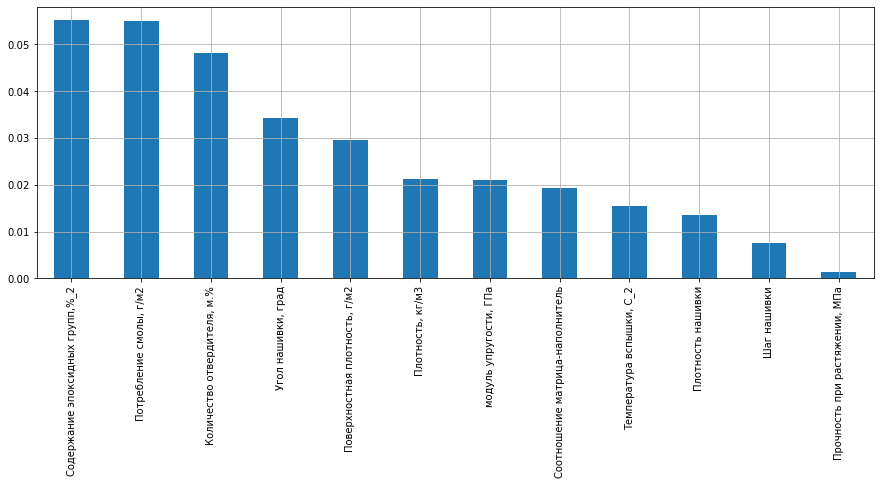

In [22]:
# Корреляция с целевым параметром Модуль упругости при растяжении
corr_resilience = df_new.corrwith(df['Модуль упругости при растяжении, ГПа']).abs().sort_values(ascending=False)
corr_resilience[1:].plot.bar(figsize = (15, 5), grid = True)

<AxesSubplot:>

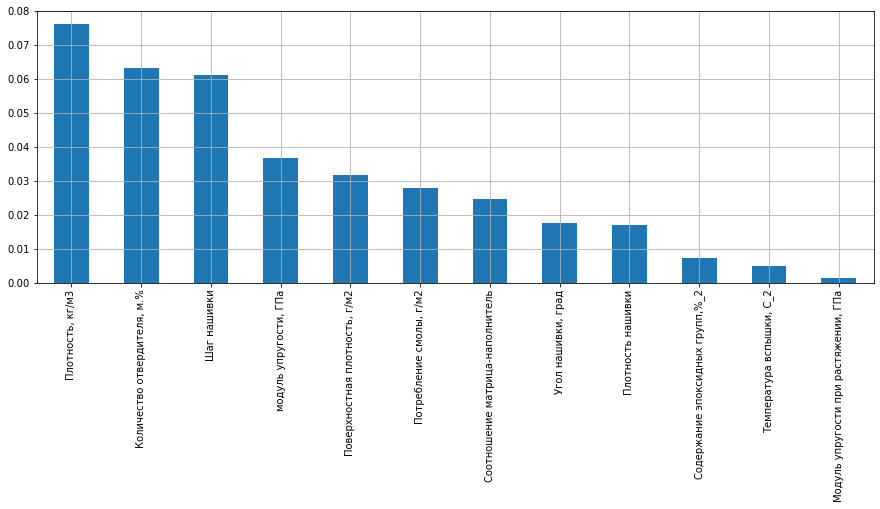

In [23]:
# Корреляция с целевым параметром Прочность при растяжении, МПа
corr_strength = df_new.corrwith(df['Прочность при растяжении, МПа']).abs().sort_values(ascending=False)
corr_strength[1:].plot.bar(figsize = (15, 5), grid = True)

<AxesSubplot:>

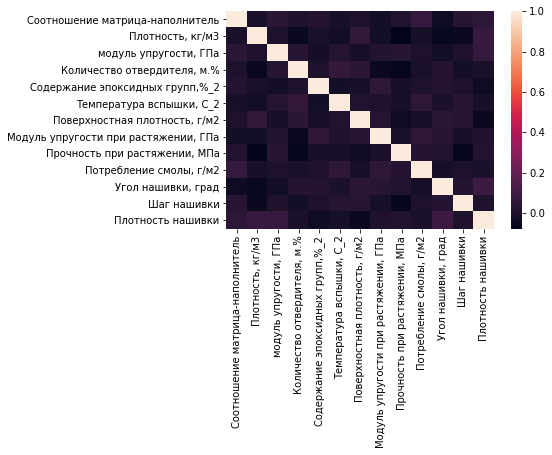

In [24]:
df_num = df_new
sns.heatmap(df_new.corr())#, annot = True)

## Train Test Split

In [25]:
# Из train выделяем данные на валидацию 
df_train, df_test = train_test_split(df_new, test_size=0.3, random_state=RANDOM_SEED)
df_new.shape, df_train.shape, df_test.shape

((936, 13), (655, 13), (281, 13))

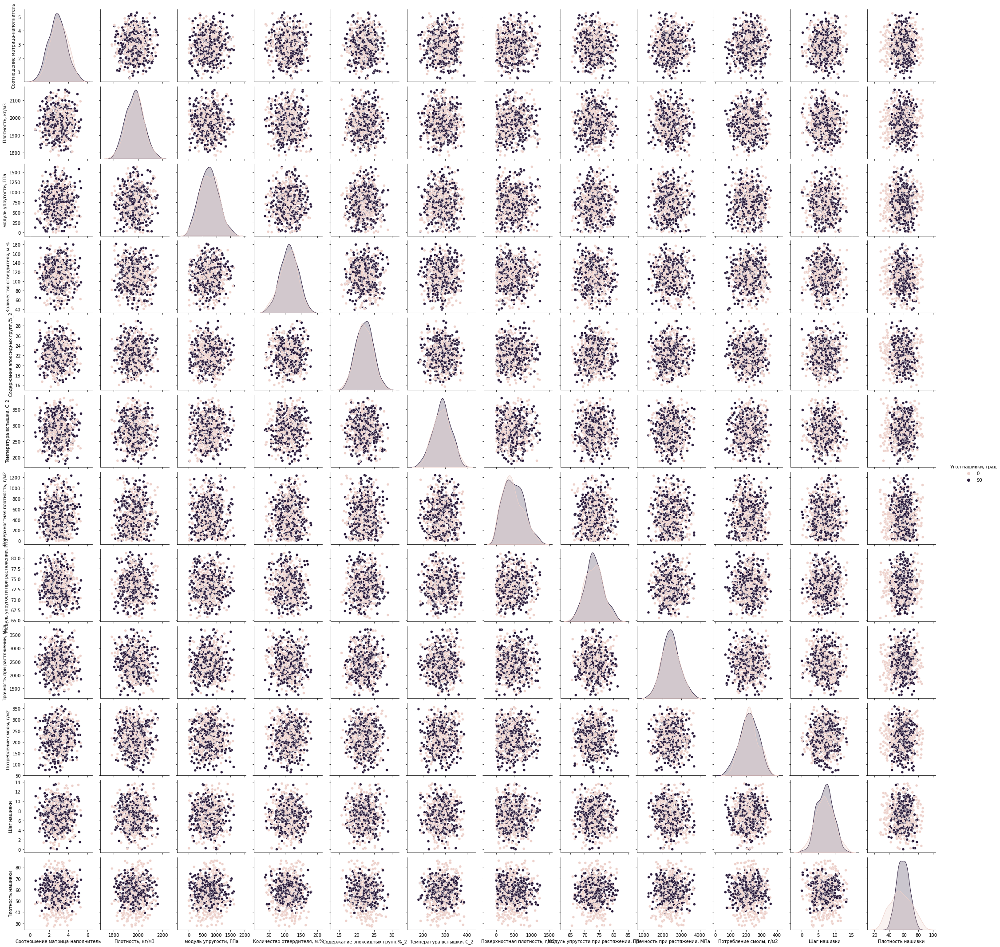

In [26]:
# Посмотрим на графики рассеяния трейна до нормализации
sns.pairplot(df_train, hue='Угол нашивки, град')

## Нормализация

In [27]:
from sklearn.preprocessing import MinMaxScaler

Поскольку в задании предлагается с помощью разных методов машинного обучения выполнить прогноз для следующих признаков:                          
- Модуль упругости при растяжении, ГПа, 
- Прочность при растяжении, МПа, 
- Соотношение матрица-наполнитель,                                       

то данные признаки исключим из нормализации и проведем по ним масштабирование.

In [28]:
cols_to_norm = df_new.columns
for col in target_cols:
    cols_to_norm = cols_to_norm.drop(col)

In [29]:
scaler = MinMaxScaler()
df_scaled = scaler.fit(df_train[cols_to_norm]) # fit по части train
df_scaled_train = df_scaled.transform(df_train[cols_to_norm])
df_scaled_test = df_scaled.transform(df_test[cols_to_norm])
df_scaled_train = pd.DataFrame(df_scaled_train, columns = cols_to_norm)
df_scaled_test = pd.DataFrame(df_scaled_test, columns = cols_to_norm)

In [30]:
# Сделаем индексы в train и test порядковыми числами для приведения в соответствие с нормированными df
df_train.index = range(len(df_train))
df_test.index = range(len(df_test))

In [31]:
# К нормированным датафреймам приклеиваем столбцы с таргетами
df_scaled_train = pd.concat([df_scaled_train, df_train[target_cols]], axis=1)
df_scaled_test = pd.concat([df_scaled_test, df_test[target_cols]], axis=1)

In [32]:
target_max_vol = {} # запоминаем максимальные значения в словарь
for col in target_cols:
    target_max_vol[col] = df_scaled_train[col].max()
    print('Максимальное значение по столбцу ', col, ' = ', df_scaled_train[col].max())

Максимальное значение по столбцу  Соотношение матрица-наполнитель  =  5.3141436851035
Максимальное значение по столбцу  Модуль упругости при растяжении, ГПа  =  81.4171259444738
Максимальное значение по столбцу  Прочность при растяжении, МПа  =  3705.67252336168


In [33]:
# масштабируем таргеты
for col, max_vol in target_max_vol.items():
    df_scaled_train[col] = df_scaled_train[col]/max_vol
    df_scaled_test[col] = df_scaled_test[col]/max_vol

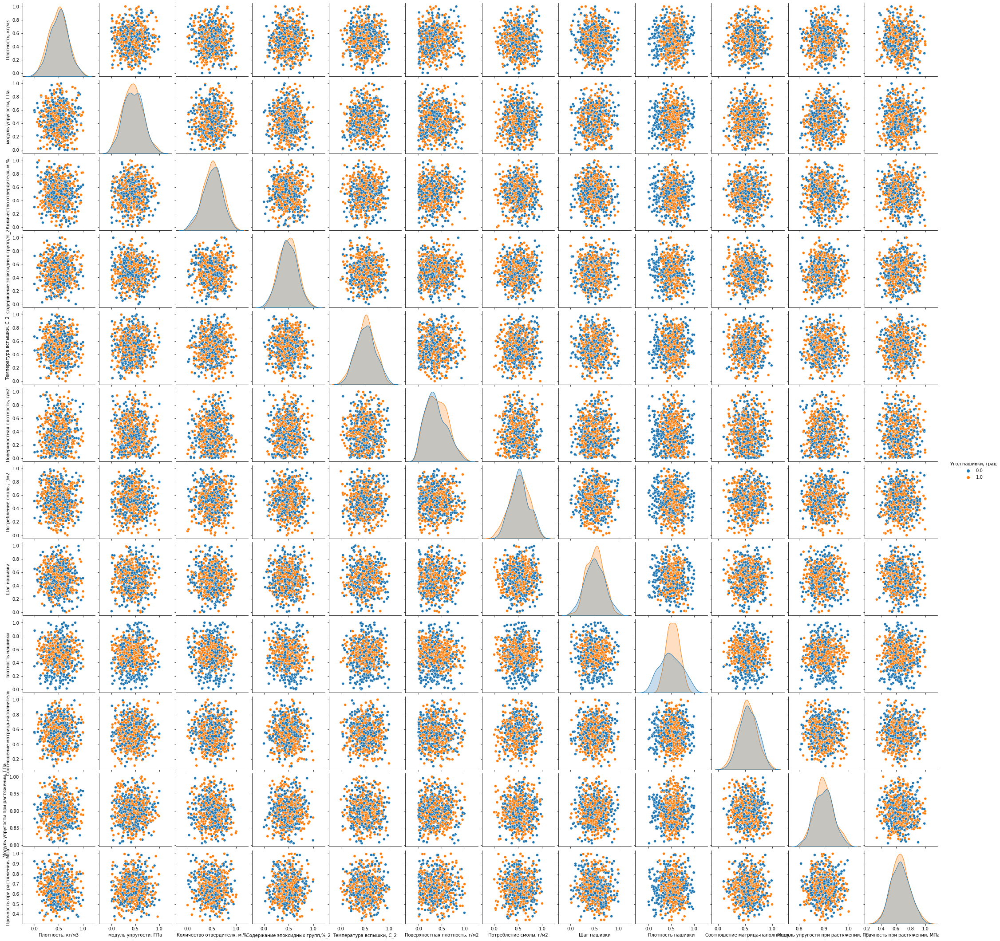

In [34]:
# Графики рассеяния трейна после нормализации
sns.pairplot(df_scaled_train, hue='Угол нашивки, град')

In [35]:
df_scaled_train.describe()

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа"
count,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000
mean,0.499855,0.448510,0.513334,0.488322,0.513724,0.383833,0.524528,0.519084,0.505399,0.514290,0.552499,0.899527,0.659563
std,0.189224,0.201150,0.192003,0.180386,0.195568,0.226180,0.195873,0.500018,0.189632,0.193938,0.169805,0.037717,0.126017
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.103006,0.805154,0.337427
25%,0.360724,0.303536,0.381763,0.364999,0.378556,0.212833,0.392745,0.000000,0.364441,0.389709,0.436429,0.873727,0.567134
50%,0.506115,0.444242,0.516289,0.486570,0.517354,0.358469,0.527493,1.000000,0.511261,0.511904,0.549416,0.898302,0.657718
75%,0.618897,0.585997,0.644797,0.618034,0.646501,0.555098,0.654629,1.000000,0.639672,0.644876,0.670122,0.923851,0.740345
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [36]:
df_scaled_test.describe()

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа"
count,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000
mean,0.512936,0.462299,0.493850,0.497964,0.521501,0.403351,0.508707,0.494662,0.504484,0.512579,0.545995,0.902319,0.680564
std,0.185751,0.204702,0.184593,0.181306,0.178785,0.226555,0.197325,0.500864,0.171599,0.185483,0.164524,0.036322,0.122134
min,0.046399,0.001170,0.033618,0.014011,0.068008,0.000860,-0.002847,0.000000,0.039232,0.025269,0.155625,0.813358,0.360913
25%,0.385881,0.326428,0.370958,0.374410,0.401968,0.226089,0.381265,0.000000,0.391235,0.390484,0.440495,0.877144,0.593290
50%,0.520423,0.462012,0.490077,0.491174,0.513874,0.389264,0.495062,0.000000,0.503375,0.523070,0.541644,0.901816,0.686309
75%,0.630592,0.601485,0.629551,0.633548,0.645243,0.568503,0.645198,1.000000,0.606274,0.624644,0.651201,0.927465,0.753921
max,1.002163,1.013174,1.005589,0.991991,0.998209,1.042705,0.992781,1.000000,1.005759,0.980055,0.996556,0.997029,0.995561


## Метрика

In [273]:
metrics_elasticity = pd.DataFrame(columns=['feature', 'model', 'MSE', 'MAE', 'MAPE', 'R2'])
metrics_strength = pd.DataFrame(columns=['feature', 'model', 'MSE', 'MAE', 'MAPE', 'R2'])
metrics_filler_matrix = pd.DataFrame(columns=['feature', 'model', 'MSE', 'MAE', 'MAPE', 'R2'])

def metrics(target, model, y_true, y_pred):
    global metrics_elasticity
    global metrics_strength
    global metrics_filler_matrix
    MSE = mean_squared_error(y_true, y_pred)
    MAE = mean_absolute_error(y_true, y_pred)
    MAPE = np.mean(np.abs((y_pred-y_true)/y_true))
    R2 = r2_score(y_true, y_pred)
    if target == 'elasticity':
        metrics_elasticity = metrics_elasticity.append({
            'feature': 'elasticity',
            'model': model,
            'MSE': round(MSE, 2),
            'MAE': round(MAE, 2),
            'MAPE': round(MAPE, 2), 
            'R2': round(R2, 2) 
        }, ignore_index=True)
        return metrics_elasticity
    if target == 'strength':
        metrics_strength = metrics_strength.append({
            'feature': 'strength',
            'model': model,
            'MSE': round(MSE, 2),
            'MAE': round(MAE, 2),
            'MAPE': round(MAPE, 2), 
            'R2': round(R2, 2) 
        }, ignore_index=True)
        return metrics_strength
    if target == 'filler_matrix':
        metrics_filler_matrix = metrics_filler_matrix.append({
            'feature': 'filler_matrix',
            'model': model,
            'MSE': round(MSE, 2),
            'MAE': round(MAE, 2),
            'MAPE': round(MAPE, 2), 
            'R2': round(R2, 2) 
        }, ignore_index=True)
        return metrics_filler_matrix

In [38]:
# по заданию отделяем таргеты для части ml от фичей
ml_targets = ['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
X_train = df_scaled_train.drop(ml_targets, axis = 1)
y_train = df_scaled_train[ml_targets].values            # наши таргеты

X_test = df_scaled_test.drop(ml_targets, axis = 1)
y_test = df_scaled_test[ml_targets].values            # наши таргеты

In [39]:
df_scaled_train

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа"
0,0.858606,0.436595,0.156821,0.876092,0.431124,0.097718,0.935369,0.0,0.332927,0.872912,0.614873,0.995531,0.933822
1,0.532788,0.382890,0.647944,0.623437,0.327025,0.223144,0.212010,1.0,0.856820,0.450655,0.462212,0.898302,0.580415
2,0.511299,0.386628,0.687896,0.703749,0.490912,0.476836,0.574415,1.0,0.289536,0.269573,0.479508,0.903495,0.818670
3,0.544913,0.249696,0.000000,0.281764,0.512788,0.064362,0.061315,1.0,0.632543,0.746264,0.506664,0.925018,0.488942
4,0.488416,0.688084,0.715396,0.403005,0.276604,0.791937,0.390962,1.0,0.351997,0.509573,0.729169,0.894693,0.708133
...,...,...,...,...,...,...,...,...,...,...,...,...,...
650,0.593688,0.423824,0.576072,0.632524,0.405216,0.240995,0.333953,0.0,0.428167,0.550694,0.747648,0.880410,0.591732
651,0.304918,0.631537,0.393275,0.115867,0.387595,0.244669,0.393188,0.0,0.361653,0.476473,0.481260,0.890002,0.624149
652,0.189222,0.663004,0.378386,0.694251,0.396582,0.357517,0.554511,1.0,0.416311,0.422657,0.435303,0.923174,0.795798
653,0.698062,0.294025,0.741220,0.528655,0.386197,0.103130,0.302126,0.0,0.366651,0.343176,0.620658,0.898086,0.900698


# ML

In [40]:
def param_searcher(estimator, X_train, y_train, param_grid, cv=3, verbose = 2):
    grid_search = GridSearchCV(estimator = estimator, param_grid = param_grid, 
                          cv = cv, n_jobs = -1, verbose = verbose)
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_

### 1. RandomForestRegressor

In [41]:
from sklearn.ensemble import RandomForestRegressor 
from pprint import pprint
import pickle

In [42]:
# # Загрузка сохраненной модели
# model_rf = pickle.load(open('model_rf', 'rb'))

In [43]:
rf = RandomForestRegressor(random_state = RANDOM_SEED)
param_grid_rf = {
    'bootstrap': [True],
    'max_depth': [60, 70, 80, 90],
    'max_features': [2, 3, 'log2', 'sqrt'],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [300, 400]
}

# Ищем параметры
model_rf = param_searcher(rf, X_train, y_train, param_grid_rf)
print(model_rf)

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   57.1s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 864 out of 864 | elapsed:  5.1min finished


RandomForestRegressor(max_depth=60, max_features=2, min_samples_leaf=5,
                      min_samples_split=8, n_estimators=300, random_state=42)


In [221]:
# Обучим модель на данных 
model_rf.fit(X_train, y_train)

pickle.dump(model_rf, open('model_rf', 'wb')) #Saving the model

y_rf = model_rf.predict(X_test)

In [224]:
# Возвращаем масштаб таргетам
y_test_unscaled = y_test.copy()
y_test_unscaled[:, 0] = y_test_unscaled[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_rf[:, 0] = y_rf[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_test_unscaled[:, 1] = y_test_unscaled[:, 1]*target_max_vol['Прочность при растяжении, МПа']
y_rf[:, 1] = y_rf[:, 1]*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
display(metrics('elasticity', 'RandomForestRegressor', y_test_unscaled[:, 0], y_rf[:, 0]))
metrics('strength', 'RandomForestRegressor', y_test_unscaled[:, 1], y_rf[:, 1])

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.7,2.39,0.03,0.0


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04


### 2. Регрессия Lasso

In [45]:
from sklearn.linear_model import MultiTaskLassoCV

In [46]:
Lasso = MultiTaskLassoCV(normalize=True, random_state = RANDOM_SEED)

param_grid_Lasso = {
    'eps': [1e-3, 1e-2, 1e-4],
    'n_alphas': [80, 90, 100],
    'tol': [1e-4, 1e-5]
}

# Ищем параметры
model_Lasso = param_searcher(Lasso, X_train, y_train, param_grid_Lasso)
print(model_Lasso)
model_Lasso.fit(X_train, y_train)

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed:    2.0s finished


MultiTaskLassoCV(n_alphas=80, normalize=True, random_state=42)


MultiTaskLassoCV(n_alphas=80, normalize=True, random_state=42)

In [225]:
y_pred_lasso = model_Lasso.predict(X_test)

# Возвращаем масштаб таргетам
y_pred_lasso[:, 0] = y_pred_lasso[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_pred_lasso[:, 1] = y_pred_lasso[:, 1]*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
display(metrics('elasticity', 'MultiTaskLassoCV', y_test_unscaled[:, 0], y_pred_lasso[:, 0]))
metrics('strength', 'MultiTaskLassoCV', y_test_unscaled[:, 1], y_pred_lasso[:, 1])

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.70,2.39,0.03,0.00
1,elasticity,MultiTaskLassoCV,8.77,2.40,0.03,-0.01


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.70,0.15,-0.03


### 3. CatBoostRegressor

In [48]:
from catboost import CatBoostRegressor

In [49]:
# # Загрузка сохраненной модели
# cat = pickle.load(open('catboost_model', 'rb'))

In [51]:
cat = CatBoostRegressor(od_wait=500, 
                        loss_function='MultiRMSE', 
                        random_state=RANDOM_SEED)
grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

# у catboost свой поиск по сетке
grid_search = cat.grid_search(grid, X=X_train, y=y_train)#, search_by_train_test_split = False)

Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1379224728
bestIteration = 161

0:	loss: 0.1379225	best: 0.1379225 (0)	total: 1.26s	remaining: 36.6s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1381675
bestIteration = 81

1:	loss: 0.1381675	best: 0.1379225 (0)	total: 2.22s	remaining: 31.1s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1401152389
bestIteration = 176

2:	loss: 0.1401152	best: 0.1379225 (0)	total: 3.31s	remaining: 29.8s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1401130696
bestIteration = 92

3:	loss: 0.1401131	best: 0.1379225 (0)	total: 4.26s	remaining: 27.7s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1412320833
bestIteration = 186

4:	loss: 0.1412321	best: 0.1379225 (0)	total: 5.39s	remaining: 27s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1415047733
bestIteration = 92

5:	loss: 0.1415048	best: 0.1379225 (0)	total: 6.36s	remai

In [52]:
# параметры модели
cat.get_params() 

{'loss_function': 'MultiRMSE',
 'od_wait': 500,
 'random_state': 42,
 'depth': 4,
 'l2_leaf_reg': 1,
 'learning_rate': 0.03}

In [53]:
pickle.dump(cat, open('catboost_model', 'wb')) #Saving the model

In [226]:
y_pred_cb = cat.predict(X_test)

# Возвращаем масштаб таргетам
y_pred_cb[:, 0] = y_pred_cb[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_pred_cb[:, 1] = y_pred_cb[:, 1]*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
display(metrics('elasticity', 'CatBoostRegressor', y_test_unscaled[:, 0], y_pred_cb[:, 0]))
metrics('strength', 'CatBoostRegressor', y_test_unscaled[:, 1], y_pred_cb[:, 1])

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.70,2.39,0.03,0.00
1,elasticity,MultiTaskLassoCV,8.77,2.40,0.03,-0.01
2,elasticity,CatBoostRegressor,8.92,2.42,0.03,-0.02


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.70,0.15,-0.03
2,strength,CatBoostRegressor,227234.51,380.61,0.16,-0.11


### 4. Xgboost

In [55]:
import xgboost as xgb

**Для признака 'Модуль упругости при растяжении, ГПа'**

In [56]:
# # Загрузка сохраненной модели
# model_xg_elasticity = pickle.load(open('model_xg_elasticity', 'rb'))

In [57]:
xg_reg = xgb.XGBRegressor(random_state = RANDOM_SEED)

param_grid_xg = {
    'n_estimators': [400, 700, 1000],
    'colsample_bytree': [0.7, 0.8],
    'max_depth': [15,20,25],
    'reg_alpha': [1.1, 1.2, 1.3],
    'reg_lambda': [1.1, 1.2, 1.3],
    'subsample': [0.7, 0.8, 0.9]
}

In [58]:
# Ищем параметры
model_xg_elasticity = param_searcher(xg_reg, X_train, y_train[:,0], param_grid_xg)
print(model_xg_elasticity)

Fitting 3 folds for each of 486 candidates, totalling 1458 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 1458 out of 1458 | elapsed:  6.5min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=15,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=700, n_jobs=4, num_parallel_tree=1, random_state=42,
             reg_alpha=1.3, reg_lambda=1.2, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)


In [227]:
# Обучим модель на данных 
model_xg_elasticity.fit(X_train, y_train[:, 0])

pickle.dump(model_xg_elasticity, open('model_xg_elasticity', 'wb')) #Saving the model

y_xg_elasticity = model_xg_elasticity.predict(X_test)

# Возвращаем масштаб таргетам
y_xg_elasticity = y_xg_elasticity*target_max_vol['Модуль упругости при растяжении, ГПа']

# считаем метрики
metrics('elasticity', 'Xgboost', y_test_unscaled[:, 0], y_xg_elasticity)

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.70,2.39,0.03,0.00
1,elasticity,MultiTaskLassoCV,8.77,2.40,0.03,-0.01
2,elasticity,CatBoostRegressor,8.92,2.42,0.03,-0.02
3,elasticity,Xgboost,9.02,2.41,0.03,-0.03


### Для признака 'Прочность при растяжении, МПа'

In [60]:
# # Загрузка сохраненной модели
# model_xg_strength = pickle.load(open('model_xg_strength', 'rb'))

In [61]:
# Ищем параметры
model_xg_strength = param_searcher(xg_reg, X_train, y_train[:,1], param_grid_xg)
print(model_xg_strength)

Fitting 3 folds for each of 486 candidates, totalling 1458 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   56.1s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed: 187.0min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed: 302.7min
[Parallel(n_jobs=-1)]: Done 1458 out of 1458 | elapsed: 302.7min finished


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=20,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=400, n_jobs=4, num_parallel_tree=1, random_state=42,
             reg_alpha=1.3, reg_lambda=1.3, scale_pos_weight=1, subsample=0.9,
             tree_method='exact', validate_parameters=1, verbosity=None)


In [228]:
# Обучим модель на данных 
model_xg_strength.fit(X_train, y_train[:, 1])

pickle.dump(model_xg_strength, open('model_xg_strength', 'wb')) #Saving the model

y_xg_strength = model_xg_strength.predict(X_test)

# Возвращаем масштаб таргетам
y_xg_strength = y_xg_strength*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
metrics('strength', 'Xgboost', y_test_unscaled[:, 1], y_xg_strength)

,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.70,0.15,-0.03
2,strength,CatBoostRegressor,227234.51,380.61,0.16,-0.11
3,strength,Xgboost,240423.04,388.45,0.16,-0.18


# Blend

In [229]:
blend_mean_elastic = (y_rf[:, 0] + y_pred_lasso[:, 0] + y_pred_cb[:, 0] + y_xg_elasticity) / 4
blend_mean_strength = (y_rf[:, 1] + y_pred_lasso[:, 1] + y_pred_cb[:, 1] + y_xg_strength) / 4

In [230]:
# считаем метрики
display(metrics('elasticity', 'Blend_mean', y_test_unscaled[:, 0], blend_mean_elastic))
metrics('strength', 'Blend_mean', y_test_unscaled[:, 1], blend_mean_strength)

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.70,2.39,0.03,0.00
1,elasticity,MultiTaskLassoCV,8.77,2.40,0.03,-0.01
2,elasticity,CatBoostRegressor,8.92,2.42,0.03,-0.02
3,elasticity,Xgboost,9.02,2.41,0.03,-0.03
4,elasticity,Blend_mean,8.69,2.38,0.03,0.00


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.70,0.15,-0.03
2,strength,CatBoostRegressor,227234.51,380.61,0.16,-0.11
3,strength,Xgboost,240423.04,388.45,0.16,-0.18
4,strength,Blend_mean,214543.56,367.31,0.15,-0.05


Блендинг дал улучшение по Модулю упругости, но по признаку Прочность растяжения он хуже, чем LassoCV.                        
В целом LassoCV показал себя лучше в решении поставленной задачи, чем остальные примененные методы машинного обучения.

# DL

In [65]:
# для части DL таргетом является признак 'Соотношение матрица-наполнитель'
X_train_dl = df_scaled_train.drop('Соотношение матрица-наполнитель', axis = 1)
y_train_dl = df_scaled_train['Соотношение матрица-наполнитель'].values            # наши таргеты

X_test_dl = df_scaled_test.drop('Соотношение матрица-наполнитель', axis = 1)
y_test_dl = df_scaled_test['Соотношение матрица-наполнитель'].values            # наши таргеты

In [66]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Sequential

In [264]:
model = Sequential()
model.add(L.Dense(128, input_dim=X_train_dl.shape[1], activation="relu"))
model.add(L.Dropout(0.75))
model.add(L.Dense(64, activation="relu"))
model.add(L.Dropout(0.5))
model.add(L.Dense(1, activation="sigmoid")) # sigmoid, т.к. данные масштабированы и приведены к виду от 0 до 1

In [265]:
print(model.summary())

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_77 (Dense)             (None, 128)               1664      
_________________________________________________________________
dropout_56 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_78 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_57 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_79 (Dense)             (None, 1)                 65        
Total params: 9,985
Trainable params: 9,985
Non-trainable params: 0
_________________________________________________________________
None


In [266]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='mean_absolute_error', metrics=['mae'])

In [267]:
history = model.fit(X_train_dl, 
                    y_train_dl, 
                    epochs=200, 
                    validation_split=0.2, 
                    verbose=0)

In [268]:
pred = model.predict(X_test_dl).flatten()

In [274]:
# Возвращаем масштаб таргетам
y_test_dl_unscaled = y_test_dl.copy()
y_test_dl_unscaled = y_test_dl_unscaled*target_max_vol['Соотношение матрица-наполнитель']
pred = pred*target_max_vol['Соотношение матрица-наполнитель']

# Считаем метрики
metrics('filler_matrix', 'NN', y_test_dl, pred)

,feature,model,MSE,MAE,MAPE,R2
0,filler_matrix,NN,5.41,2.31,4.87,-199.67


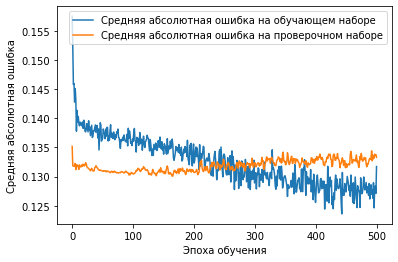

In [270]:
# графики 
plt.plot(history.history['mae'], 
         label='Средняя абсолютная ошибка на обучающем наборе')
plt.plot(history.history['val_mae'], 
         label='Средняя абсолютная ошибка на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Средняя абсолютная ошибка')
plt.legend()
plt.show()


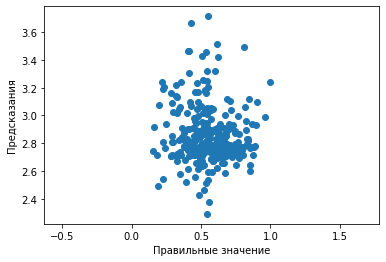

In [271]:
# Разброс предсказаний может показать перекос, если есть
plt.scatter(y_test_dl, pred) 
plt.xlabel('Правильные значение')
plt.ylabel('Предсказания')
plt.axis('equal')
plt.xlim(plt.xlim())
plt.ylim(plt.ylim())
plt.plot([-100, 100], [-100, 100])
plt.show()

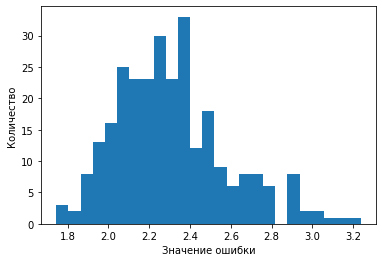

In [272]:
# Гистограмма ошибок
error = pred - y_test_dl #Разность предсказанного и правильного ответа
#Построение гистограммы
plt.hist(abs(error), bins = 25)
plt.xlabel("Значение ошибки")
plt.ylabel("Количество")
plt.show()